This is notebook is to test and inspect how the model works on data that has not been used in the training process (108 images).

In [1]:
import copy
import os
from math import ceil
import pickle

import optuna
from optuna.trial import TrialState
import pandas as pd
from pathlib import Path
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import StratifiedKFold
import torch
from torch import nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import transforms, models
from torchvision.ops import box_iou
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

/home/vik/anaconda3/envs/ml_env/lib/python3.8/site-packages/sklearn/utils/multiclass.py:13: DeprecationWarning: Please use `spmatrix` from the `scipy.sparse` namespace, the `scipy.sparse.base` namespace is deprecated.
  from scipy.sparse.base import spmatrix
/home/vik/anaconda3/envs/ml_env/lib/python3.8/site-packages/sklearn/linear_model/least_angle.py:30: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  method='lar', copy_X=True, eps=np.finfo(np.float).eps,
/home/vik/anaconda3/envs/ml_env/lib/python3.8/site-packages/sklearn/linear_model/least_angle.py:167: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `f

### perform test split

In [2]:
from sklearn.model_selection import train_test_split

In [22]:
label_csv_all = '/home/vik/code/surge/bbregression/all_images_full/labels/all_labels_alb_complete_and_curated.csv'
label_df_all = pd.read_csv(label_csv_all, index_col=None)
label_df_all.reset_index(inplace=True, drop=True)
label_df_all

,target,bx,by,bw,bh,imageFile,w,h,x1,y1,x2,y2,size
0,image,81.0,252.0,573.0,426.0,IMG_20210122_124701.jpg,750.0,1000.0,0.108000,0.252000,0.872000,0.678000,8397846.0
1,image,41.0,49.0,362.0,486.0,IMG_20210625_151548.jpg,450.0,600.0,0.091111,0.081667,0.895556,0.891667,6954647.0
2,image,23.0,54.0,407.0,503.0,IMG_20210625_151849.jpg,450.0,600.0,0.051111,0.090000,0.955556,0.928333,6344976.0
3,image,76.0,108.0,296.0,377.0,IMG_20210625_151718.jpg,450.0,600.0,0.168889,0.180000,0.826667,0.808333,6313428.0
4,image,47.0,73.0,379.0,455.0,IMG_20210625_151857.jpg,450.0,600.0,0.104444,0.121667,0.946667,0.880000,6161344.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4545,image,NaN,NaN,NaN,NaN,alb1_IMG_20210625_151834.jpg,NaN,NaN,0.253036,0.220596,0.839069,0.903092,NaN
4546,image,NaN,NaN,NaN,NaN,alb2_IMG_20210625_151834.jpg,NaN,NaN,0.103668,0.237049,0.753743,0.791433,NaN
4547,image,NaN,NaN,NaN,NaN,alb0_IMG_20210625_151924.jpg,NaN,NaN,0.113306,0.283167,1.000000,0.721463,NaN
4548,image,NaN,NaN,NaN,NaN,alb1_IMG_20210625_151924.jpg,NaN,NaN,0.107499,0.311917,0.846001,0.726450,NaN


In [23]:
df_train, df_test = train_test_split(label_df_all, test_size=0.1, random_state=0, stratify=label_df_all.target)

/home/vik/anaconda3/envs/ml_env/lib/python3.8/site-packages/sklearn/utils/__init__.py:806: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  return floored.astype(np.int)
/home/vik/anaconda3/envs/ml_env/lib/python3.8/site-packages/sklearn/utils/__init__.py:806: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to revie

In [103]:
# better all in one folder
#import shutil
#for f in df_test.imageFile:
#    shutil.move('shrinked_for_training_bb/'+f, 'shrinked_for_testing_bb/'+f)

In [24]:
df_test.to_csv('all_images_full/labels/all_labels_alb_test.csv', index=False)

In [25]:
df_train.to_csv('all_images_full/labels/all_labels_alb_train.csv', index=False)

In [72]:
df_train.shape

(4095, 13)

In [3]:
def calcNewDimsWH(width, height, maxSize):
    """ calc dims for downscale image according to maximum allowed size """
    
    if width < height:
        newHeight = maxSize
        ratio = height/maxSize
        newWidth = ceil(width/ratio)
    else:
        newWidth = maxSize
        ratio = width/maxSize
        newHeight = ceil(height/ratio)
        
    return newWidth, newHeight



def convertLabelCsvSize(old_csv, new_csv, width, height, equal_size, max_size):
    """ Correct bounding box data in csv for downsampled images """

    df = pd.read_csv(old_csv, names=['target', 'c1', 'c2', 'c3', 'c4', 'imageFile', 'w', 'h'])
    
    if equal_size:
        new_width = width
        new_height = height
        
    else:
        new_width = []
        new_height = []
        
        for w, h in zip(df.w, df.h):
            new_w, new_h = calcNewDimsWH(w, h, max_size)
            new_width.append(new_w)
            new_height.append(new_h)
            
        new_width = np.array(new_width)
        new_height = np.array(new_height)
    
    c1 = np.round(df.c1/df.w * new_width).astype('int')
    c2 = np.round(df.c2/df.h * new_height).astype('int')
    c3 = np.round(df.c3/df.w * new_width).astype('int')
    c4 = np.round(df.c4/df.h * new_height).astype('int')
    df2 = pd.DataFrame({'target':df.target, 'c1':c1, 'c2':c2, 'c3':c3, 'c4':c4, 'imageFile':df.imageFile, 'w':new_width, 'h':new_height}, columns=None)
        
    df2.to_csv(new_csv, header=False, index=False)
    
    


In [4]:
test_imageFolder = 'shrinked_for_training_bb'#
app_imageFolder = 'roi_test_set_max480'
#old_csv = 'roi_test_set_max640/labels_2022-03-01.csv'
#new_csv = 'roi_test_set_max640/labels_2022-03-01.csv'
test_csv = 'all_images_full/labels/all_labels_alb_test.csv'#
app_csv = 'roi_test_set_max480/labels_480.csv'
#convertLabelCsvSize(old_csv, new_csv, 480, 480, False, 480)
#labeledCSV = new_csv

In [5]:
def get_model_simple():
    
    """ Returns FasterRCNN with Mobilenet v3 backbone (resizing images to 320px on the shorter side) prepared for transfer learning """
    
    model = models.detection.fasterrcnn_mobilenet_v3_large_320_fpn(pretrained=True, box_detections_per_img=1)
    for param in model.parameters():
        param.requires_grad = False

    num_classes = 3  # painting, object & background
    
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes) 
    
    return model


model_weights = 'mobilenet_320_full_low_lr9_30_lr0001_m88_04_01_24_new_labels.pkl'
device = torch.device('cpu')

# loading two models
model = get_model_simple()
model_eval = get_model_simple()
model.load_state_dict(torch.load(model_weights, map_location=device))
model_eval.load_state_dict(torch.load(model_weights, map_location=device))
model.train()
model_eval.eval()

/home/vik/.local/lib/python3.8/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/vik/.local/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_MobileNet_V3_Large_320_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_MobileNet_V3_Large_320_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(320,), max_size=640, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (0): Conv2dNormActivation(
        (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (1): FrozenBatchNorm2d(16, eps=1e-05)
        (2): Hardswish()
      )
      (1): InvertedResidual(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=16, bias=False)
            (1): FrozenBatchNorm2d(16, eps=1e-05)
            (2): ReLU(inplace=True)
          )
          (1): Conv2dNormActivation(
            (0): Conv2d(16, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
            (1): FrozenBatchNorm2d(16, eps=1e-05)
          )
        )
      )
      (2): InvertedResidual(
        (block): 

In [6]:
RPNtransform = transforms.Compose([ transforms.ToTensor() ])


class RPNDataset(torch.utils.data.Dataset):
    def __init__(self, imageFolder, labelsPath, subset=None, transform=None, mode='rel'):

        self.transform = transform
        
        if mode=='rel':
            self.df = pd.read_csv(labelsPath, index_col=None)
        else:
            self.df = pd.read_csv(labelsPath, index_col=None, names=['target', 'c1', 'c2', 'c3', 'c4', 'imageFile', 'w', 'h'])
        
        self.labels = self.df.target

        # if not rel, convert the bounding box coordinates from starting point + box height/width to two points as fractions of height/width
        if mode=='rel':
            self.x1 = self.df.x1.to_numpy()
            self.y1 = self.df.y1.to_numpy()
            self.x2 = self.df.x2.to_numpy()
            self.y2 = self.df.y2.to_numpy()
        else:
            self.x1 = (self.df.c1/self.df.w).to_numpy()
            self.y1 = (self.df.c2/self.df.h).to_numpy()
            self.x2 = ((self.df.c1 + self.df.c3)/self.df.w).to_numpy()
            self.y2 = ((self.df.c2 + self.df.c4)/self.df.h).to_numpy()

        try:
            self.images = [os.path.join(imageFolder, image) for image in self.df.imageFile]
        except:
            print(imageFolder, self.df.imageFile[0], type(self.df.imageFile[1]))


        if type(self.df.target[0])==str:
            self.targets = [0 for i in range(len(self.df))]
            for idx, target in enumerate(self.df.target):
                if target == 'image':
                    self.targets[idx] = 1
                elif target == 'object':
                    self.targets[idx] = 2 # prev 0,
                else:
                    print( f'error in {target} {idx}')
            self.labels = self.targets

        if subset is not None:
            self.x1 = self.x1[subset]
            self.y1 = self.y1[subset]
            self.x2 = self.x2[subset]
            self.y2 = self.y2[subset]
            self.labels = [self.labels[idx] for idx in subset]
            self.images = [self.images[idx] for idx in subset]

    def __len__(self):
        return len(self.images)

    def __getitem__(self, index):
        img = Image.open(self.images[index])
        img.thumbnail((640,640))
        w = img.width
        h = img.height

        box = torch.tensor([self.x1[index]*w, self.y1[index]*h, self.x2[index]*w, self.y2[index]*h], dtype=torch.float32)
        target = {
                'boxes': box,
                'labels': torch.tensor(self.labels[index]),
                'image_id' : torch.tensor(index),
                'image_path': self.images[index]
            }

        if not img.mode == 'RGB':
            img = img.convert('RGB')
        img = RPNtransform(img)
        return img, target

In [7]:
app_data = RPNDataset(app_imageFolder, app_csv, mode='abs')


test_data = RPNDataset(test_imageFolder, test_csv, mode='rel')
batch_size = 1

def collate_fn(batch):
    return tuple(zip(*batch))

test_loader = torch.utils.data.DataLoader(test_data, batch_size=batch_size, shuffle=False, num_workers=2, collate_fn=collate_fn)
app_loader = torch.utils.data.DataLoader(app_data, batch_size=batch_size, shuffle=False, num_workers=2, collate_fn=collate_fn)


In [8]:
def evaluate(test_loader):

    all_images = []
    true_boxes = []
    pred_boxes = []
    loss_dicts = []
    all_preds = []
    all_targets = []
    box_ious = []

    test_loss = []
    nr_pred = []


    with torch.set_grad_enabled(False):

        for img, targets in test_loader:

            all_images.append(targets[0]['image_path'])

            targets = [{k: v for k, v in t.items()} for t in targets]

            all_targets.append(targets)

            true_boxes.append(targets[0]['boxes'].unsqueeze(0).detach().numpy()[0])

            for target in targets:
                target['boxes'] = target['boxes'].unsqueeze(0)
                target['labels'] = target['labels'].unsqueeze(0)
                target['image_id'] = target['image_id'].unsqueeze(0)

            loss_dict = model(img, targets)
            pred = model_eval(img)

            iou = box_iou(targets[0]['boxes'],pred[0]['boxes'])
            box_ious.append(iou)

            bbox = pred[0]['boxes'].numpy()
            loss_dicts.append(loss_dict)
            all_preds.append(pred)
            #print('targets: ', targets)
            #print('loss dict: ', loss_dict)
            #print('pred: ', pred, '\n')
            #print('bbox: ', bbox, bbox.shape)
            #print('image: ', targets[0]['image_path'])
            nr_pred.append(bbox.shape)

            if bbox.shape[0] > 0:
                pred_boxes.append(bbox)

            else:
                # if no painting or object is found, the default prediction is [0.25, 0.25, 0.75, 0.75]
                # not needed for testing
                #bbox_default = np.array([0.25, 0.25, 0.75, 0.75]) * [image_width, image_height, image_width, image_height]
                pred_boxes.append([])

            loss = sum(loss for loss in loss_dict.values())
            loss_value = loss.item()
            #print('loss: ', loss_value, '\n')

            test_loss.append(loss_value)


    batch_loss = sum(test_loss)/len(test_loss)

    print('Test Batch Loss: {:.4f},  '.format(batch_loss))

    sum_ious = sum([t[0] for t in box_ious if t.shape[1]>0])
    avg_iou = sum_ious/len(pred_boxes)
    print(f'Test IOU: {avg_iou[0]}')
    
    # converting lists to numpy for argsort

    test_loss_n = np.array(test_loss)
    all_images = np.array(all_images)
    pred_boxes_a = np.array(pred_boxes, dtype=object)
    true_boxes = np.array(true_boxes)
    loss_dicts = np.array(loss_dicts)
    all_preds = np.array(all_preds)
    all_targets = np.array(all_targets)
    
    
    complete_misses = sum([type(box)==list for box in pred_boxes_a])/pred_boxes_a.size
    print(f'Test complete misses: {complete_misses}')
    print('\n')
 

    print(f'Images with highest losses: ')
    
    idxs = test_loss_n.argsort()
    test_loss_all = test_loss_n[idxs]
    top_loss_images = all_images[idxs]
    top_loss_boxes_pred = pred_boxes_a[idxs]
    top_loss_boxes_true = true_boxes[idxs]
    top_loss_preds = all_preds[idxs]
    top_loss_dicts = loss_dicts[idxs]
    top_loss_targets = all_targets[idxs]
    
    fig = plt.figure(figsize=(16, 40))
    columns = 4
    rows = 3#27

    for counter, i in enumerate(top_loss_images[:12]):
        img = Image.open(i)

        img_true = ImageDraw.Draw(img)
        img_true.rectangle(top_loss_boxes_true[counter].tolist(), outline='green', width=10)

        if top_loss_preds[counter][0]['boxes'].shape[0]>0:
            img_pred = ImageDraw.Draw(img)
            img_pred.rectangle(top_loss_preds[counter][0]['boxes'][0].tolist(), outline='blue', width=10)

        ax = fig.add_subplot(rows, columns, counter+1)

        ax.set_axis_off()

        plt.imshow(img, aspect='equal')


    plt.show()

Test Batch Loss: 0.4414,  
Test IOU: 0.7132193446159363
Test complete misses: 0.0


Images with highest losses: 


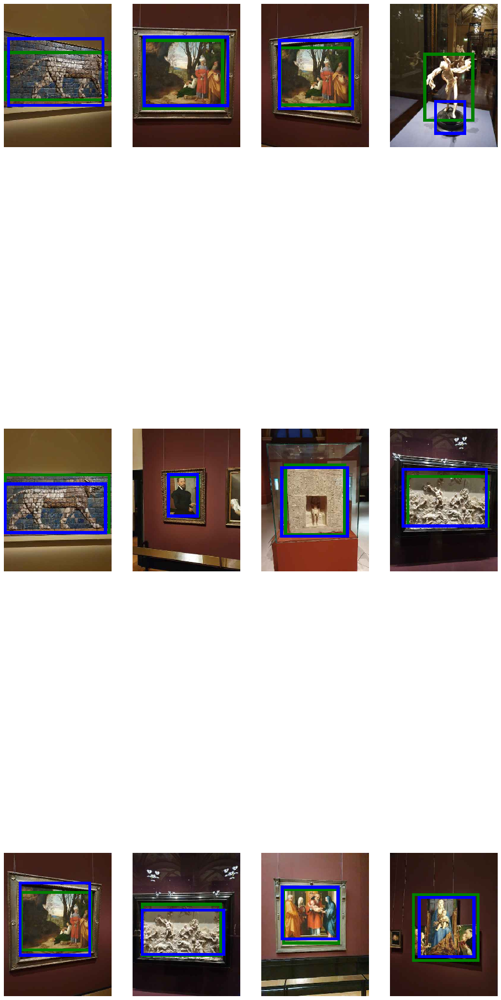

In [9]:
evaluate(app_loader)

Test Batch Loss: 0.4283,  
Test IOU: 0.7481265068054199
Test complete misses: 0.03076923076923077


Images with highest losses: 


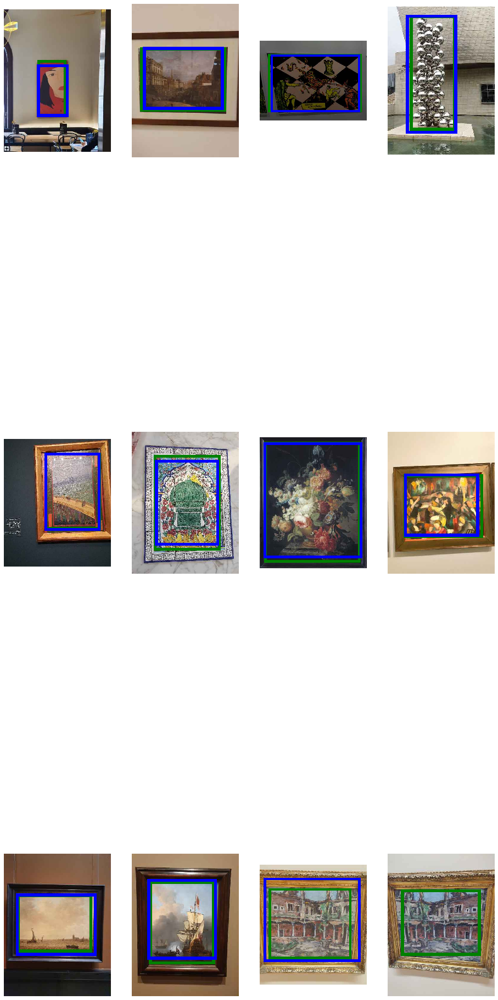

In [10]:
evaluate(test_loader)

## Inspecting for quality

Here are some helper functions to inspect the bounding boxes of the training & test dataset

In [18]:
def inspect_test_case(select):
    
    """ Helper function to print all data and show predicted vs true bounding box """
    
    print('image: ', top_loss_images[select])
    print('pred: ', top_loss_preds[select])
    print('target: ', top_loss_targets[select])
    print('loss dict: ', top_loss_dicts[select], test_loss_all[select])
    print('top loss boxes: ', top_loss_boxes_pred[select], top_loss_boxes_true[select])
    img = Image.open(top_loss_images[select])
    if top_loss_preds[select][0]['boxes'].shape[0]>0:
        img_pred = ImageDraw.Draw(img)
        img_pred.rectangle(top_loss_preds[select][0]['boxes'][0].tolist(), outline='blue', width=10)
    img_true = ImageDraw.Draw(img)
    img_true.rectangle(top_loss_targets[select][0]['boxes'][0].tolist(), outline='green', width=10)
    plt.imshow(img)

In [26]:
def inspect_any(imageName):
    
    """ Helper function to show predicted vs true bounding box """
    idx = label_df_all.loc[label_df_all['imageFile']==imageName].index[0]
    print(label_df_all.loc[idx, :])
    img = Image.open('shrinked_for_training_bb/' + imageName)
    w, h = img.width, img.height

    img_true = ImageDraw.Draw(img)
    img_true.rectangle([label_df_all.x1[idx]*w, label_df_all.y1[idx]*h, label_df_all.x2[idx]*w, label_df_all.y2[idx]*h], outline='green', width=10)
    plt.imshow(img)
    
    
def inspect_many(imageNameList):
    """ Helper function to print all data and show predicted vs true bounding box for a list of images"""
    
    counter = 0
    columns = 4
    rows = len(imageNameList)//4 + 1
    fig = plt.figure(figsize=(16, rows*5))
    
    for counter, i in enumerate(imageNameList):
    
        
        idx = label_df_all.loc[label_df_all['imageFile']==i].index
        if idx.any():
            idx = idx[0]
        else:
            continue
        print(label_df_all.loc[idx, :])
        img = Image.open('shrinked_for_training_bb/' + i)
        w, h = img.width, img.height

        img_true = ImageDraw.Draw(img)
        img_true.rectangle([label_df_all.x1[idx]*w, label_df_all.y1[idx]*h, label_df_all.x2[idx]*w, label_df_all.y2[idx]*h], outline='green', width=10)
        
        ax = fig.add_subplot(rows, columns, counter+1)
        
        ax.set_axis_off()
        
        plt.imshow(img)
        
        counter += 1
        
    plt.show()

target                         image
bx                             423.0
by                            1439.0
bw                            1409.0
bh                            2088.0
imageFile    IMG_20210625_151628.jpg
w                             3456.0
h                             4608.0
x1                          0.122396
y1                          0.312283
x2                          0.530093
y2                          0.765408
size                       1568286.0
Name: 1319, dtype: object


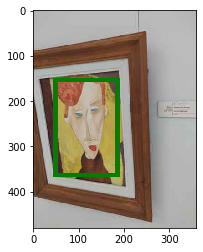

In [27]:
inspect_any('IMG_20210625_151628.jpg')

Unnamed: 0                       43.0
target                          image
bx                               89.0
by                              153.0
bw                              376.0
bh                              285.0
imageFile     IMG_20210625_150705.jpg
w                               562.0
h                               600.0
x1                           0.158363
y1                              0.255
x2                           0.827402
y2                               0.73
size                        5131655.0
Name: 34, dtype: object
Unnamed: 0                       51.0
target                          image
bx                              105.0
by                              155.0
bw                              390.0
bh                              287.0
imageFile     IMG_20210625_150712.jpg
w                               566.0
h                               600.0
x1                           0.185512
y1                           0.258333
x2                        

Unnamed: 0                      105.0
target                          image
bx                               64.0
by                               84.0
bw                              396.0
bh                              348.0
imageFile     IMG_20210625_151217.jpg
w                               551.0
h                               600.0
x1                           0.116152
y1                               0.14
x2                           0.834846
y2                               0.72
size                        4454008.0
Name: 83, dtype: object
Unnamed: 0                       20.0
target                          image
bx                               33.0
by                              103.0
bw                              400.0
bh                              339.0
imageFile     IMG_20210625_151224.jpg
w                               450.0
h                               600.0
x1                           0.073333
y1                           0.171667
x2                        

Unnamed: 0                     1314.0
target                          image
bx                               41.0
by                               54.0
bw                              360.0
bh                              502.0
imageFile     IMG_20200903_164759.jpg
w                               450.0
h                               600.0
x1                           0.091111
y1                               0.09
x2                           0.891111
y2                           0.926667
size                          88714.0
Name: 1098, dtype: object
Unnamed: 0                     1343.0
target                          image
bx                               42.0
by                              119.0
bw                              373.0
bh                              355.0
imageFile     IMG_20200907_163121.jpg
w                               450.0
h                               600.0
x1                           0.093333
y1                           0.198333
x2                      

Unnamed: 0              1392.0
target                   image
bx                        71.0
by                       115.0
bw                       428.0
bh                       256.0
imageFile     griff_museum.jpg
w                        600.0
h                        450.0
x1                    0.118333
y1                    0.255556
x2                    0.831667
y2                    0.824444
size                   65100.0
Name: 1168, dtype: object
Unnamed: 0                1472.0
target                     image
bx                          94.0
by                         149.0
bw                         278.0
bh                         339.0
imageFile     gunther_blurry.jpg
w                          450.0
h                          600.0
x1                      0.208889
y1                      0.248333
x2                      0.826667
y2                      0.813333
size                     45029.0
Name: 1235, dtype: object
Unnamed: 0                1422.0
target             

Unnamed: 0                    1445.0
target                         image
bx                              75.0
by                             186.0
bw                             282.0
bh                             270.0
imageFile     korab_glare_schräg.jpg
w                              450.0
h                              600.0
x1                          0.166667
y1                              0.31
x2                          0.793333
y2                              0.76
size                         52675.0
Name: 1211, dtype: object
Unnamed: 0                   1400.0
target                        image
bx                             41.0
by                            175.0
bw                            378.0
bh                            257.0
imageFile     landschaft_gerade.jpg
w                             450.0
h                             600.0
x1                         0.091111
y1                         0.291667
x2                         0.931111
y2                      

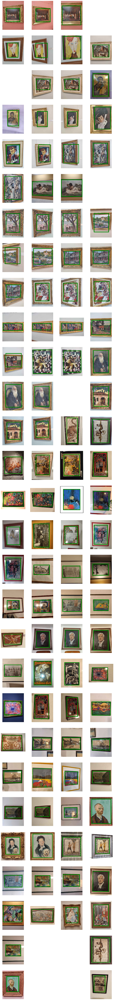

In [114]:
first = pd.read_csv('/home/vik/code/surge/bbregression/all_images_full/labels/first_labels.csv', header=None)
s=first.iloc[:,[5]].values
s = [e[0] for e in s]
s
inspect_many(s)

target                         image
bx                            1079.0
by                            1184.0
bw                            1736.0
bh                            2471.0
imageFile    IMG_20210625_151834.jpg
w                             3456.0
h                             4608.0
x1                          0.312211
y1                          0.256944
x2                          0.814525
y2                          0.793186
size                       2492625.0
Name: 1320, dtype: object


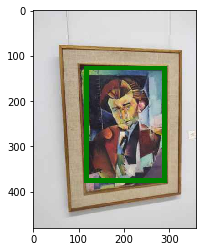

In [28]:
inspect_any('IMG_20210625_151834.jpg')

Unnamed: 0                                       1277.0
target                                            image
bx                                                187.0
by                                                 87.0
bw                                                232.0
bh                                                182.0
imageFile     WhatsApp Image 2023-07-08 at 19.41.01.jpg
w                                                 640.0
h                                                 357.0
x1                                             0.292187
y1                                             0.243697
x2                                             0.654687
y2                                             0.753501
size                                           104823.0
Name: 1070, dtype: object


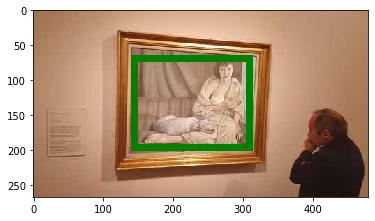

In [56]:
inspect_any('WhatsApp Image 2023-07-08 at 19.41.01.jpg')

target                       image
bx                             3.0
by                           439.0
bw                           737.0
bh                          1697.0
imageFile    20210922_180249_2.jpg
w                           1348.0
h                           2486.0
x1                        0.002226
y1                        0.176589
x2                        0.548961
y2                        0.859212
size                      367219.0
Name: 1310, dtype: object


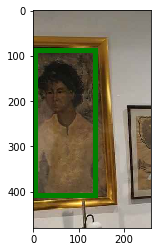

In [31]:
inspect_any('20210922_180249_2.jpg')

In [143]:
bad_original_images = ['IMG_20210625_150712.jpg', 'IMG_20210625_150705.jpg', 'IMG_20210625_150718.jpg', 'IMG_20210625_151628.jpg', 'IMG_20210625_151031.jpg', 'IMG_20210625_151037.jpg', 'IMG_20210625_151834.jpg', 'IMG_20210625_151542.jpg', 'IMG_20210625_151213.jpg', 'IMG_20210625_151924.jpg', 'IMG_20210625_151217.jpg', '20210922_180246.jpg', '20210922_180249.jpg']

In [146]:
from rotation_correction import correct_rotation
for image in bad_original_images:
    img = Image.open('all_images_full/'+image)
    if not img.mode == 'RGB':
        img = img.convert('RGB')
        
    img, _ = correct_rotation(img)
    
    img.save('images_to_fix/' + image, 'JPEG', quality=80)

In [8]:
labels_for_image_fix = pd.read_csv('/home/vik/code/surge/bbregression/all_images_full/labels/labels_my-project-name_2023-12-29-09-53-13.csv')

In [17]:
labels_for_image_fix['size'] = None
for idx, row in labels_for_image_fix.iterrows():
    path = Path(f"/home/vik/code/surge/bbregression/images_to_fix/{row['imageFile']}")
    if path.exists():
        labels_for_image_fix.at[idx, 'size'] = path.stat().st_size

In [15]:
labels_for_image_fix['x1'] = (labels_for_image_fix.bx/labels_for_image_fix.w).to_numpy()
labels_for_image_fix['y1'] = (labels_for_image_fix.by/labels_for_image_fix.h).to_numpy()
labels_for_image_fix['x2'] = ((labels_for_image_fix.bx + labels_for_image_fix.bw)/labels_for_image_fix.w).to_numpy()
labels_for_image_fix['y2'] = ((labels_for_image_fix.by + labels_for_image_fix.bh)/labels_for_image_fix.h).to_numpy()

In [19]:
labels_for_image_fix.to_csv('/home/vik/code/surge/bbregression/all_images_full/labels/image_fix_manually.csv', index=False)

In [20]:
all_original_labels = pd.read_csv('/home/vik/code/surge/bbregression/all_images_full/labels/all_labels.csv')

In [21]:
all_original_labels

,Unnamed: 0,target,bx,by,bw,bh,imageFile,w,h,x1,y1,x2,y2,size
0,0,image,325,132,71,62,Sala_I_in_Museo_Sorolla_Madrid_on_20161106.jpg,640,426,0.507812,0.309859,0.618750,0.455399,8837721.0
1,1,image,478,123,108,80,Sala_I_in_Museo_Sorolla_Madrid_on_20161106.jpg,640,426,0.746875,0.288732,0.915625,0.476526,8837721.0
2,2,image,50,87,157,119,Sala_I_in_Museo_Sorolla_Madrid_on_20161106.jpg,640,426,0.078125,0.204225,0.323437,0.483568,8837721.0
3,3,image,354,33,190,371,Signorelli_-_Wings_Pala_Bichi_-_Gemäldegalerie...,640,426,0.553125,0.077465,0.850000,0.948357,8673708.0
4,4,image,99,33,186,371,Signorelli_-_Wings_Pala_Bichi_-_Gemäldegalerie...,640,426,0.154688,0.077465,0.445312,0.948357,8673708.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1553,1557,image,61,35,61,83,25a4687b-8330-3ff6-9fb6-deda5667a446.jpeg,178,180,0.342697,0.194444,0.685393,0.655556,3421.0
1554,370,image,0,0,600,450,20210824_150212.jpg,600,450,0.000000,0.000000,1.000000,1.000000,NaN
1555,408,image,23,5,567,438,IMG_20210625_152930 (copy 1).jpg,600,452,0.038333,0.011062,0.983333,0.980088,NaN
1556,436,image,21,16,559,429,IMG_20210625_150718 (copy 1).jpg,600,470,0.035000,0.034043,0.966667,0.946809,NaN


In [142]:
inspect_many(bad_original_images)

In [36]:
test_df = pd.read_csv('/home/vik/code/surge/bbregression/all_images_full/labels/all_labels_alb_test.csv')

In [37]:
test_df

,target,bx,by,bw,bh,imageFile,w,h,x1,y1,x2,y2,size
0,image,NaN,NaN,NaN,NaN,alb0_20210917_163212.jpg,NaN,NaN,0.174357,0.272219,0.835098,0.899353,NaN
1,object,NaN,NaN,NaN,NaN,alb0_bilbao-sculpture-guggenheim.jpg,NaN,NaN,0.207809,0.064370,0.641058,0.837715,NaN
2,image,NaN,NaN,NaN,NaN,alb0_20230324_165353.jpg,NaN,NaN,0.154352,0.271990,0.851311,0.842660,NaN
3,object,NaN,NaN,NaN,NaN,alb2_Dollarphotoclub_5378865.jpg,NaN,NaN,0.000000,0.000000,0.933755,1.000000,NaN
4,object,NaN,NaN,NaN,NaN,alb1_20230601_143332.jpg,NaN,NaN,0.079696,0.054067,0.927910,0.966766,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
450,image,NaN,NaN,NaN,NaN,alb0_image00067.jpg,NaN,NaN,0.268459,0.230227,0.701238,0.804995,NaN
451,image,NaN,NaN,NaN,NaN,alb2_WhatsApp Image 2023-07-11 at 11.18.11.jpg,NaN,NaN,0.296915,0.259219,0.678865,0.785329,NaN
452,image,NaN,NaN,NaN,NaN,alb0_20210922_165855.jpg,NaN,NaN,0.111545,0.000000,0.816341,1.000000,NaN
453,image,NaN,NaN,NaN,NaN,alb2_20210921_164327.jpg,NaN,NaN,0.080166,0.215590,0.852799,0.649957,NaN


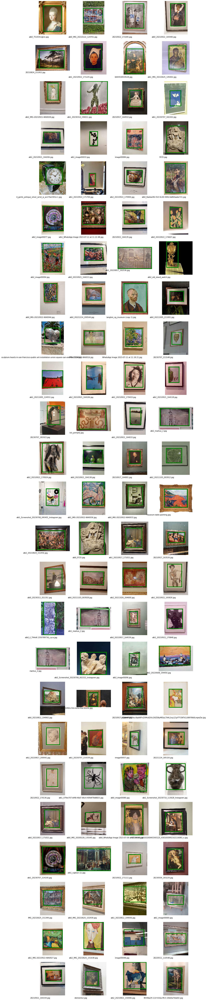

In [41]:
fig = plt.figure(figsize=(16, 500))
columns = 4
rows = 120
counter = 0

for idx, row in test_df[100:200].iterrows():
    #if 'alb' in row.imageFile:
    img = Image.open('shrinked_for_training_bb/' + row.imageFile)
    #if idx<20: print(row.imageFile)
    w,h = img.width, img.height
    img_true = ImageDraw.Draw(img)
    img_true.rectangle([row.x1*w, row.y1*h, row.x2*w, row.y2*h], outline='green', width=10)

    ax = fig.add_subplot(rows, columns, counter+1)
    ax.text(0.0, -0.1, row.imageFile, horizontalalignment='center', verticalalignment='bottom', transform=ax.transAxes)
    plt.imshow(img)
    ax.set_axis_off()

    counter += 1

    plt.imshow(img, aspect='equal')